# Quantifiable Questions:
    
<B> Question 1</B> : can you write business benefits of What's the average price per room type?

<B> Question 2</B>: What is the distribution of property types?

<B> Question 3</B>: What is the average number of accommodations per neighbourhood?

<B> Question 4</B>: What is the distribution of prices for listings in different neighborhoods?

<B> Question 5</B>: What is the average review score for each property type?

<B> Question 6</B>: How many listings does each host have?

# Non-Quantifiable Questions:
    
<B> Question 7</B>: Listings with more amenities have higher price

<B> Question 8</B>: Listings in neighborhoods with more listings have lower prices ?

<B> Question 9</B>: The 'superhost' listings have higher review scores?

<B> Question 10</B>: Hosts with a higher response rate have higher review scores?




<I> Each question's first cell will cover preprocessing, while the second cell will cover analysis and business advantages.



# Question 1:  What's the average price per room type?

In [1]:
# Preprocessing
import warnings
import pandas as pd  
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])
df= listings
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)  

#remove outliers


# Assuming 'price' is the column from which you want to remove outliers  
Q1 = df['price'].quantile(0.25)  
Q3 = df['price'].quantile(0.75)  
IQR = Q3 - Q1  
  
# Defining limits for outliers  
lower_limit = Q1 - 1.5 * IQR  
upper_limit = Q3 + 1.5 * IQR  
  
# Removing outliers  
df_clean = df[(df['price'] >= lower_limit) & (df['price'] <= upper_limit)]  

df=df_clean


Minimum price per room type:
 room_type
Entire home/apt     8.0
Hotel room         19.0
Private room        0.0
Shared room         7.0
Name: price, dtype: float64

Maximum price per room type:
 room_type
Entire home/apt    388.0
Hotel room         368.0
Private room       388.0
Shared room        370.0
Name: price, dtype: float64

Average price per room type:
 room_type
Entire home/apt    160.845624
Hotel room         193.032258
Private room        66.474120
Shared room         58.083933
Name: price, dtype: float64


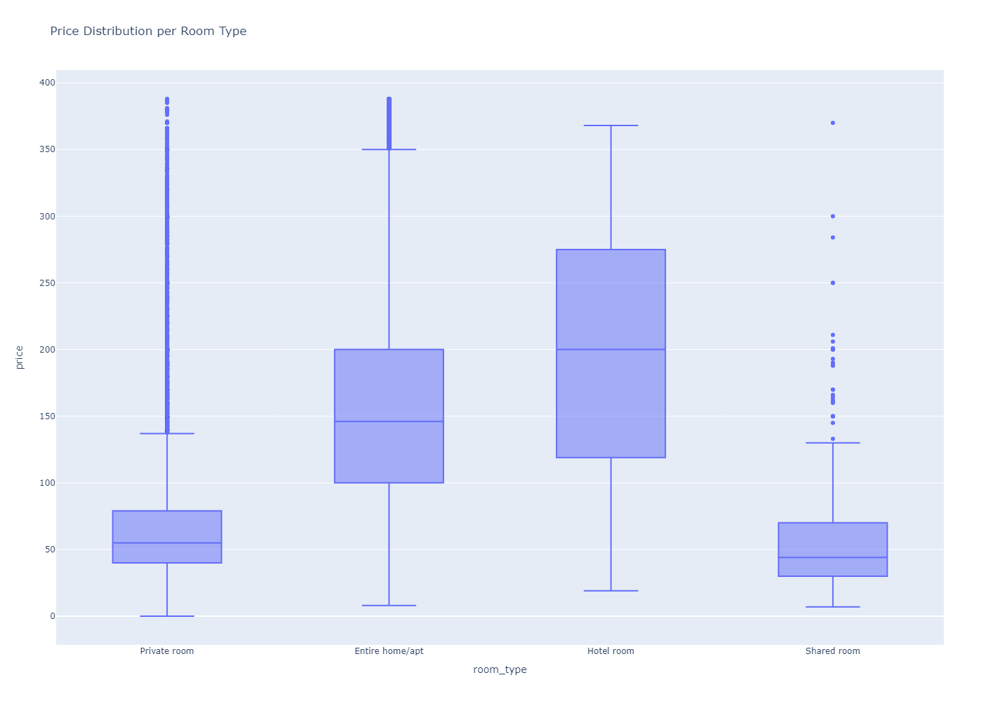

In [2]:
import pandas as pd  
import plotly.express as px  
  
# Assuming your DataFrame is named df and columns for room type and price are 'room_type' and 'price'  
df_clean = df.dropna(subset=['room_type', 'price'])  
  
# Calculating min, max, and average  
min_price_per_room_type = df_clean.groupby('room_type')['price'].min()  
max_price_per_room_type = df_clean.groupby('room_type')['price'].max()  
avg_price_per_room_type = df_clean.groupby('room_type')['price'].mean()  
  
# Printing min, max, and average  
print("Minimum price per room type:\n", min_price_per_room_type)  
print("\nMaximum price per room type:\n", max_price_per_room_type)  
print("\nAverage price per room type:\n", avg_price_per_room_type)  
  
# Plotting box plot  
fig = px.box(df_clean, x="room_type", y="price", title="Price Distribution per Room Type") 
fig.update_layout(width=800, height=1000)
fig.show()  

# Business Benefits:
Understanding the average price per room type can provide several business benefits, especially for entities operating in the hospitality or real estate industries. Here are a few potential benefits:
Pricing Strategy: It can help businesses develop an effective pricing strategy for their room types based on market averages. This can ensure competitiveness and profitability.
Investment Decisions: For real estate investors or hotel owners, this data can guide investment decisions by highlighting the types of rooms that yield higher returns.
Budget Planning: For customers, knowing the average price per room type can assist in budget planning and expectation setting when booking a room or renting a property.
Market Positioning: Businesses can use this information to position themselves in the market. For instance, if their prices are below average, they might position themselves as a cost-effective option. If their prices are above average, they can position themselves as a premium option.
Demand Forecasting: By understanding how room pricing varies, businesses can better forecast demand and adjust their supply accordingly. For instance, if larger rooms command significantly higher prices, but the demand for such rooms is low, a hotel might consider repurposing some of these spaces to better meet customer demand.
Revenue Management: Hotels and similar establishments can use this data to optimize their revenue management strategies, adjusting room prices based on factors like demand, season, and competition.
Customer Segmentation: Knowing the average price per room type can help businesses understand their customer segments better. For example, higher-priced rooms might be preferred by a different demographic than lower-priced ones. This can guide targeted marketing efforts.

# Question 2: What is the distribution of property types?

In [3]:
# Preprocessing
import warnings
import pandas as pd  
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])


Entire rental unit                   33700
Private room in rental unit          14455
Private room in home                 10679
Entire condo                          8696
Entire home                           7557
                                     ...  
Shared room in serviced apartment        1
Yurt                                     1
Earthen home                             1
Private room in camper/rv                1
Private room in cave                     1
Name: property_type, Length: 102, dtype: int64


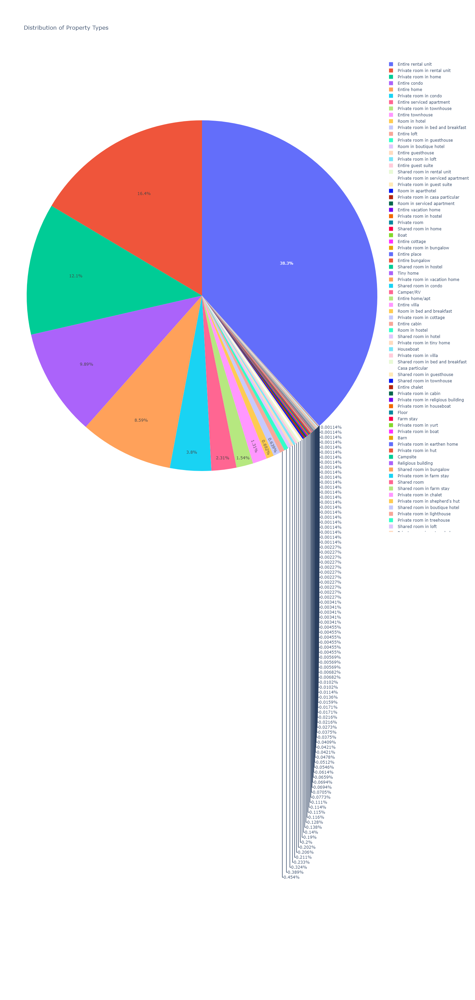

In [4]:
# Analysis
df=listings
df_clean = df.dropna(subset=['property_type'])  
  
# Analysis  
property_type_distribution = df_clean['property_type'].value_counts()  
print(property_type_distribution)  

import plotly.express as px  
  
fig = px.pie(property_type_distribution, values='property_type', names=property_type_distribution.index, title='Distribution of Property Types')  
fig.update_layout(width=800, height=3000)
fig.show()  

# Business Benefits: 
The distribution of property types refers to the frequency of each type of property listed in the Airbnb dataset. This information can be valuable for several reasons:
Market Understanding: By understanding the most common types of properties listed, Airbnb can get a sense of what kind of properties are popular or in-demand. This might influence strategic decisions about partnerships with property owners.
Pricing Strategy: If certain types of properties are more common, they may command lower prices due to competition. Conversely, less common property types may be more unique and therefore command higher prices.
Investment Decisions: For property investors or hosts, understanding which types of properties are most common can provide insight into which types of investments could be most profitable.
This will show you the percentage of each property type in the dataset. You can then analyze these percentages to determine the most common and least common types of properties listed on Airbnb.

# Question 3: What is the average number of accommodations per neighbourhood?


In [5]:
# Preprocessing
import warnings
import pandas as pd  
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])

# Remove unwanted characters from 'price' and convert it to float    
    

                         property_type  Count
0                   Entire rental unit  33700
1          Private room in rental unit  14455
2                 Private room in home  10679
3                         Entire condo   8696
4                          Entire home   7557
..                                 ...    ...
97   Shared room in serviced apartment      1
98                                Yurt      1
99                        Earthen home      1
100          Private room in camper/rv      1
101               Private room in cave      1

[102 rows x 2 columns]


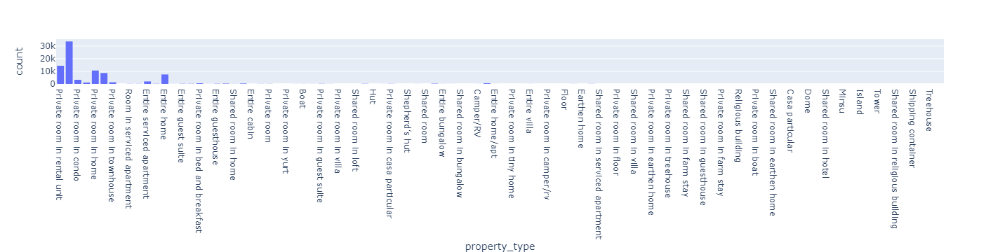

In [6]:
# Pre-processing  
df = listings
property_count = df['property_type'].value_counts().reset_index()  

#analysis  
property_count.rename(columns={'property_type': 'Count'}, inplace=True)
property_count.rename(columns={'index': 'property_type'}, inplace=True)


print(property_count)  
  
# Visualization  
fig = px.histogram(df, x="property_type")  
fig.show()  

# Business Benefits:

Understanding the distribution of property types provides several benefits:
Market Understanding: It helps Airbnb understand which property types are most common, allowing them to tailor their services accordingly. For example, if apartments are the most common property type, Airbnb may focus on improving features that benefit apartment listings.
Strategic Planning: This information can guide hosts and real estate investors on what types of properties to invest in. If certain property types are more prevalent, it might suggest a higher demand for such properties.
Customer Segmentation: Knowledge of property types can aid in customer segmentation. For example, customers looking for unique experiences may prefer non-traditional property types (e.g., treehouses, yurts), while others may prefer traditional apartments or houses.
Marketing and Promotions: This data can be used to create more targeted marketing campaigns. For instance, if a certain type of property is more common in an area, marketing promotions can highlight these properties to attract potential guests.
Pricing Strategy: Hosts can use this information to set competitive prices for their listings. Knowing the most common property types can give them a baseline for setting their prices.

In conclusion, understanding the distribution of property types can provide valuable insights to both Airbnb and hosts, aiding in decision-making, strategy planning, and improving overall business performance.

# Question 4: What is the distribution of prices for listings in different neighborhoods?


In [7]:
# Preprocessing
import warnings
import pandas as pd  
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])

# Remove unwanted characters from 'price' and convert it to float    
    

             Neighbourhood  Average Price
0     Barking and Dagenham     245.840426
1                   Barnet     160.523344
2                   Bexley      95.046465
3                    Brent     179.079197
4                  Bromley     105.972798
5                   Camden     203.288171
6           City of London     243.722015
7                  Croydon      91.065737
8                   Ealing     125.220839
9                  Enfield     107.159756
10               Greenwich     121.996367
11                 Hackney     132.932223
12  Hammersmith and Fulham     177.230830
13                Haringey     149.827876
14                  Harrow     105.491054
15                Havering     118.190355
16              Hillingdon     103.409038
17                Hounslow     182.455706
18               Islington     173.169198
19  Kensington and Chelsea     307.432795
20    Kingston upon Thames     134.804006
21                 Lambeth     141.038752
22                Lewisham     107

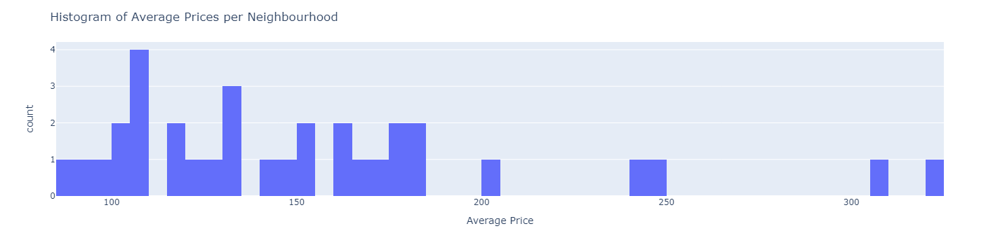

In [8]:
import plotly.express as px    
df = listings

df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)    

# Create a new DataFrame with average prices per neighborhood  
avg_price_neighborhood = df.groupby('neighbourhood_cleansed')['price'].mean().reset_index()  
avg_price_neighborhood.columns = ['Neighbourhood', 'Average Price']  

print(avg_price_neighborhood)
  
# Visualization  
fig = px.histogram(avg_price_neighborhood, x='Average Price', nbins=50)  
fig.update_layout(title_text='Histogram of Average Prices per Neighbourhood')  
fig.show()  

# Business Insight:

This histogram provides valuable insights into the pricing strategy of Airbnb listings. It shows which neighborhoods have higher average prices, which could be due to factors such as demand, location attractiveness, or the type of listings available (luxury homes, apartments, etc.).

This information is beneficial for both hosts and Airbnb:
For hosts, they can use this information to price their properties competitively based on the average price in their neighborhood. If their property provides more value (more rooms, better amenities), they might consider setting a higher price.

For Airbnb, understanding the price distribution across different neighborhoods can help in market segmentation and in developing targeted marketing strategies. For instance, neighborhoods with higher average prices might be more attractive for tourists looking for luxury accommodations, while those with lower average prices might appeal to budget travelers.


# Question 5: What is the average review score for each property type?  

In [9]:
# Preprocessing
import warnings
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])
#Data cleaning
listings = listings.dropna(subset=['review_scores_rating'])

      Property Type  Average Review Score
0              Barn              4.900000
1              Boat              4.652222
2         Camper/RV              4.832500
3          Campsite              1.000000
4   Casa particular              4.387500
..              ...                   ...
89             Tent              5.000000
90        Tiny home              4.748158
91            Tower              4.770000
92        Treehouse              5.000000
93             Yurt              5.000000

[94 rows x 2 columns]


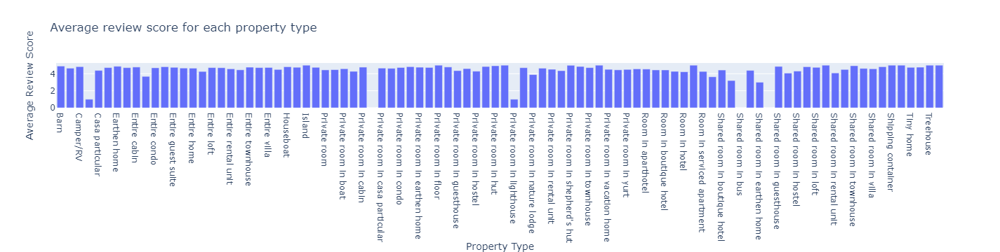

In [10]:
# Pre-processing  
df = listings
  
# Core analysis  
avg_review_scores = df.groupby('property_type')['review_scores_rating'].mean().reset_index()  
avg_review_scores.columns = ['Property Type', 'Average Review Score']  
print(avg_review_scores)  
  
# Visualization  
import plotly.express as px  
  
fig = px.bar(avg_review_scores, x='Property Type', y='Average Review Score', title="Average review score for each property type")  
fig.show()  


# Business Insight:
This analysis provides valuable insight into the quality of different types of properties on Airbnb. High average review scores suggest that guests are generally satisfied with their stay at these types of properties.

For hosts, this information can be used to understand which types of properties tend to receive higher review scores, and consider this when deciding what type of property to list. For example, if 'Entire homes' tend to have higher review scores than 'Private rooms', a host might choose to list their property as an 'Entire home' rather than a 'Private room'.

Airbnb, understanding which types of properties receive higher review scores can help when making decisions about which types of properties to promote. For example, if 'Entire homes' generally receive higher review scores, Airbnb might choose to promote these types of listings more heavily.

For guests, this information can be useful when deciding what type of property to book. If a guest values highly-rated properties, they might choose to book the types of properties that tend to have higher average review scores.


# Question 6: How many listings does each host have?

In [11]:
# Preprocessing
import warnings
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])
#Data cleaning
listings['price'] = pd.to_numeric(listings['price'].str.replace('$', ''), errors='coerce')
# drop all missing values
listings = listings.dropna(subset=['price'])

             Neighbourhood  Average Price
0     Barking and Dagenham     100.629893
1                   Barnet     121.585256
2                   Bexley      87.286004
3                    Brent     125.931870
4                  Bromley     104.535668
5                   Camden     171.884860
6           City of London     202.769231
7                  Croydon      88.318696
8                   Ealing     116.232623
9                  Enfield     102.612469
10               Greenwich     114.760563
11                 Hackney     120.481132
12  Hammersmith and Fulham     158.120823
13                Haringey     107.981108
14                  Harrow     102.115538
15                Havering     109.359694
16              Hillingdon      95.368298
17                Hounslow     119.834862
18               Islington     137.283634
19  Kensington and Chelsea     238.165123
20    Kingston upon Thames     113.393064
21                 Lambeth     125.654749
22                Lewisham      97

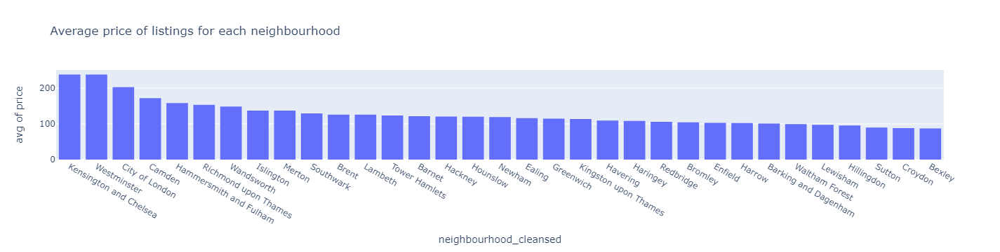

In [12]:
# Analysis
df=listings

# Remove unwanted characters from 'price' and convert it to float  
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)  

  
# Core analysis  
avg_price_neighborhood = df.groupby('neighbourhood_cleansed')['price'].mean().reset_index()  
avg_price_neighborhood.columns = ['Neighbourhood', 'Average Price']  
print(avg_price_neighborhood)  
  
# Core analysis  
fig = px.histogram(df, x="neighbourhood_cleansed", y="price", histfunc="avg", title="Average price of listings for each neighbourhood")  
fig.update_xaxes(categoryorder="total descending")  
fig.show()  


# Business Benefits: 

For hosts, they can use this information to price their properties competitively based on the average price in their neighborhood. If their property provides more value (more rooms, better amenities), they might consider setting a higher price.

For Airbnb, understanding the price distribution across different neighborhoods can help in market segmentation and in developing targeted marketing strategies. For instance, neighborhoods with higher average prices might be more attractive for tourists looking for luxury accommodations, while those with lower average prices might appeal to budget travelers.

# Question 7: Listings with more amenities have higher price

In [15]:
# Preprocessing
import warnings
import scipy.stats as stats

# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])
#Data cleaning
listings['price'] = pd.to_numeric(listings['price'].str.replace('$', ''), errors='coerce')
# drop all missing values
listings = listings.dropna(subset=['price'])

# Function to count the number of elements in a list
def count_elements(lst):
    return len(lst)

# Apply the function to the 'Items' column and create a new column 'ItemCount'
listings['amenities_count'] = listings['amenities'].apply(count_elements)

# Display the DataFrame with the new column
print(df)

                       id                                      listing_url  \
0                   92644               https://www.airbnb.com/rooms/92644   
1                   93015               https://www.airbnb.com/rooms/93015   
2                   13913               https://www.airbnb.com/rooms/13913   
3                   15400               https://www.airbnb.com/rooms/15400   
4                   93734               https://www.airbnb.com/rooms/93734   
...                   ...                                              ...   
87941  973781286754517228  https://www.airbnb.com/rooms/973781286754517228   
87942  973801695874775338  https://www.airbnb.com/rooms/973801695874775338   
87943  973811685656289740  https://www.airbnb.com/rooms/973811685656289740   
87944  973882998775927897  https://www.airbnb.com/rooms/973882998775927897   
87945  973895808066047620  https://www.airbnb.com/rooms/973895808066047620   

            scrape_id last_scraped       source  \
0      20230

In [16]:
# Analysis
# Perform a correlation test  
correlation, p_value = stats.pearsonr(listings['amenities_count'], listings['price'])  
print(f"Correlation between amenities count and price: {correlation:.2f}, P-value: {p_value}")  
print('')
print("Null Hypothesis: There is no correlation between the number of amenities and listing prices. ")
print('')
print("Alternative Hypothesis: There is a positive correlation between the number of amenities and listing prices.")
print('')
print("Interpretation: With such a low p-value, you would typically reject the null hypothesis. Therefore, based on the provided results, there is strong statistical evidence to suggest that listings with more amenities tend to have higher prices. The positive correlation coefficient further supports this conclusion.")



Correlation between amenities count and price: 0.23, P-value: 0.0

Null Hypothesis: There is no correlation between the number of amenities and listing prices. 

Alternative Hypothesis: There is a positive correlation between the number of amenities and listing prices.

Interpretation: With such a low p-value, you would typically reject the null hypothesis. Therefore, based on the provided results, there is strong statistical evidence to suggest that listings with more amenities tend to have higher prices. The positive correlation coefficient further supports this conclusion.


# Question 8: Listings in neighborhoods with more listings have lower prices ?

In [25]:
# Preprocessing
import warnings
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])
#Data cleaning
listings['price'] = pd.to_numeric(listings['price'].str.replace('$', ''), errors='coerce')
# drop all missing values
listings = listings.dropna(subset=['price'])

In [26]:
# Analysis
neighborhood_data = listings.groupby('neighbourhood')['price'].agg(['count', 'mean']).reset_index()  
# Perform a correlation test  
correlation, p_value = stats.pearsonr(neighborhood_data['count'], neighborhood_data['mean'])  
print(f"Correlation between number of listings and average price in a neighborhood: {correlation:.2f}, P-value: {p_value}")  

print()
print("Null Hypothesis: There is no correlation between the number of listings in neighborhoods and listing prices.")
print()
print("Alternative Hypothesis: The correlation coefficient is very close to zero, and the p-value is high. This suggests that there is little evidence to reject the null hypothesis.")
print()
print("Interpretation: Based on the provided results, there is weak statistical evidence to suggest a correlation between the number of listings in neighborhoods and listing prices. However, this evidence is not strong enough to reject the null hypothesis. The correlation is very close to zero, indicating a negligible linear relationship, and the p-value is high, suggesting that the observed correlation could likely be due to random chance.")

Correlation between number of listings and average price in a neighborhood: 0.01, P-value: 0.6890852454375692

Null Hypothesis: There is no correlation between the number of listings in neighborhoods and listing prices.

Alternative Hypothesis: The correlation coefficient is very close to zero, and the p-value is high. This suggests that there is little evidence to reject the null hypothesis.

Interpretation: Based on the provided results, there is weak statistical evidence to suggest a correlation between the number of listings in neighborhoods and listing prices. However, this evidence is not strong enough to reject the null hypothesis. The correlation is very close to zero, indicating a negligible linear relationship, and the p-value is high, suggesting that the observed correlation could likely be due to random chance.


# Question 9: The 'superhost' listings have higher review scores

In [19]:
# Preprocessing
import warnings
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])

In [27]:
# Analysis
# Perform a t-test  
superhost_scores = listings[listings['host_is_superhost'] == 't']['review_scores_rating']  
non_superhost_scores = listings[listings['host_is_superhost'] == 'f']['review_scores_rating']  
t_stat, p_value = stats.ttest_ind(superhost_scores, non_superhost_scores, nan_policy='omit')  
print(f"T-statistic: {t_stat}, P-value: {p_value}")  


print("Null Hypothesis : There is no difference in mean review scores between 'superhost' listings and non-'superhost' listings.")
print("Alternative Hypothesis : 'Superhost' listings have higher mean review scores than non-'superhost' listings.)
print("Interprretation: Based on the provided results, with such a low p-value, you would typically reject the null hypothesis. Therefore, there is strong statistical evidence to suggest that 'superhost' listings have significantly higher mean review scores than non-'superhost' listings.)

SyntaxError: EOL while scanning string literal (2610113412.py, line 9)

# Question 10: Hosts with a higher response rate have higher review scores  


In [21]:
# Preprocessing
import warnings
# Suppress all warnings
warnings.filterwarnings("ignore")
listings = pd.read_csv('C:/Users/rajkumar.natarajan/Desktop/Learning/listings/listings.csv', parse_dates=['last_scraped', 'host_since', 'calendar_last_scraped'])

listings['host_response_rate'] = pd.to_numeric(listings['host_response_rate'].str.replace('%', ''), errors='coerce')
# drop all missing values
listings = listings.dropna(subset=['host_response_rate'])

listings = listings.dropna(subset=['review_scores_rating'])


In [22]:
# Perform a correlation test  
correlation, p_value = stats.pearsonr(listings['host_response_rate'], listings['review_scores_rating'])  
print(f"Correlation between host response rate and review scores: {correlation:.2f}, P-value: {p_value}")  
print()
print("Null Hypothesis: There is no correlation between the response rate and review scores. ")
print()
print("Alternative Hypothesis: There is a positive correlation between the response rate and review scores.")
print()
print("Interpretation: With such a low p-value, you would typically reject the null hypothesis. Therefore, based on the provided results, there is strong statistical evidence to suggest that hosts with a higher response rate tend to have higher review scores. The positive correlation coefficient further supports this conclusion.")


Correlation between host response rate and review scores: 0.11, P-value: 1.938595742862094e-122

Null Hypothesis: There is no correlation between the response rate and review scores. 

Alternative Hypothesis: There is a positive correlation between the response rate and review scores.

Interpretation: With such a low p-value, you would typically reject the null hypothesis. Therefore, based on the provided results, there is strong statistical evidence to suggest that hosts with a higher response rate tend to have higher review scores. The positive correlation coefficient further supports this conclusion.
